Modelo Detección de Pallets

Estructura de datos:

  
    dataset/
        images/
            train/
            val/
        labels/
            train/
            val/

Archivo .yaml, para que sepa el modelo pre entrenado YOLO v8 nano sepa qué va a aprender:

path: dataset

train: images/train

val: images/val

nc: 1  # Número de clases, en este caso "pallet"

names: ['pallet']


In [1]:
!pip install ultralytics

   ---------------------------------------- 0.0/881.2 kB ? eta -:--:--
   -- ------------------------------------- 61.4/881.2 kB 1.7 MB/s eta 0:00:01
   --------- ------------------------------ 204.8/881.2 kB 2.5 MB/s eta 0:00:01
   ------------------ --------------------- 399.4/881.2 kB 3.1 MB/s eta 0:00:01
   ------------------------------- -------- 686.1/881.2 kB 3.9 MB/s eta 0:00:01
   --------------------------------- ------ 747.5/881.2 kB 3.9 MB/s eta 0:00:01
   ---------------------------------------- 881.2/881.2 kB 3.5 MB/s eta 0:00:00
   ---------------------------------------- 0.0/203.0 MB ? eta -:--:--
   ---------------------------------------- 0.2/203.0 MB 4.5 MB/s eta 0:00:46
   ---------------------------------------- 0.4/203.0 MB 6.2 MB/s eta 0:00:33
   ---------------------------------------- 0.5/203.0 MB 4.7 MB/s eta 0:00:44
   ---------------------------------------- 0.7/203.0 MB 4.0 MB/s eta 0:00:51
   ---------------------------------------- 0.9/203.0 MB 4.5 MB/s e

In [2]:
import os
import shutil
import random

# Configuración
data_dir = "YOLO"
images_dir = os.path.join(data_dir, "images")
labels_dir = os.path.join(data_dir, "labels")

# Carpetas de salida
output_images_train = os.path.join(data_dir, "images/train")
output_images_val = os.path.join(data_dir, "images/val")
output_images_test = os.path.join(data_dir, "images/test")
output_labels_train = os.path.join(data_dir, "labels/train")
output_labels_val = os.path.join(data_dir, "labels/val")
output_labels_test = os.path.join(data_dir, "labels/test")

# Crear carpetas de destino
os.makedirs(output_images_train, exist_ok=True)
os.makedirs(output_images_val, exist_ok=True)
os.makedirs(output_images_test, exist_ok=True)
os.makedirs(output_labels_train, exist_ok=True)
os.makedirs(output_labels_val, exist_ok=True)
os.makedirs(output_labels_test, exist_ok=True)

# Listar todas las imágenes
image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]
random.shuffle(image_files)

# Calcular índices para la división
total_files = len(image_files)
train_split = int(total_files * 0.7)  # 70% para entrenamiento
val_split = int(total_files * 0.9)  # 20% para validación y 10% para prueba

# Dividir en conjuntos de entrenamiento, validación y prueba
train_files = image_files[:train_split]
val_files = image_files[train_split:val_split]
test_files = image_files[val_split:]

# Mover archivos de entrenamiento
for file_name in train_files:
    # Mover imagen
    shutil.move(os.path.join(images_dir, file_name), os.path.join(output_images_train, file_name))
    # Mover etiqueta correspondiente
    label_name = os.path.splitext(file_name)[0] + ".txt"
    if os.path.exists(os.path.join(labels_dir, label_name)):
        shutil.move(os.path.join(labels_dir, label_name), os.path.join(output_labels_train, label_name))

# Mover archivos de validación
for file_name in val_files:
    # Mover imagen
    shutil.move(os.path.join(images_dir, file_name), os.path.join(output_images_val, file_name))
    # Mover etiqueta correspondiente
    label_name = os.path.splitext(file_name)[0] + ".txt"
    if os.path.exists(os.path.join(labels_dir, label_name)):
        shutil.move(os.path.join(labels_dir, label_name), os.path.join(output_labels_val, label_name))

# Mover archivos de prueba
for file_name in test_files:
    # Mover imagen
    shutil.move(os.path.join(images_dir, file_name), os.path.join(output_images_test, file_name))
    # Mover etiqueta correspondiente
    label_name = os.path.splitext(file_name)[0] + ".txt"
    if os.path.exists(os.path.join(labels_dir, label_name)):
        shutil.move(os.path.join(labels_dir, label_name), os.path.join(output_labels_test, label_name))

print("División en conjuntos de entrenamiento, validación y prueba completada.")


División en conjuntos de entrenamiento, validación y prueba completada.


In [3]:
from ultralytics import YOLO

model = YOLO('yolov8n.pt')

results = model.train(
    data='C:\\Users\\julia\\Documents\\Tec de Monterrey\\7mo Semestre\\modelo_pallets\\data.yaml',
    epochs=100,
    batch=32,
    imgsz=720,
    augment=True,
    name='model_100epochs_batch32_imgsz_720'
)

New https://pypi.org/project/ultralytics/8.3.31 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.28  Python-3.12.4 torch-2.5.1+cpu CPU (AMD Ryzen 7 5800H with Radeon Graphics)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=C:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\data.yaml, epochs=100, time=None, patience=100, batch=32, imgsz=720, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=model_100epochs_batch32_imgsz_720, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=Tru

train: Scanning C:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\labels\train.cache... 105 images, 0 backgrounds, 0 corrupt: 100%|██████████| 105/105 [00:00<?, ?it/s]
val: Scanning C:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\labels\val.cache... 30 images, 0 backgrounds, 0 corrupt: 100%|██████████| 30/30 [00:00<?, ?it/s]


Plotting labels to runs\detect\model_100epochs_batch32_imgsz_720\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 736 train, 736 val
Using 0 dataloader workers
Logging results to runs\detect\model_100epochs_batch32_imgsz_720
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100         0G      1.549      4.322      1.623         71        736: 100%|██████████| 4/4 [01:14<00:00, 18.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.20s/it]

                   all         30        115   0.000225     0.0879   0.000297   0.000146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100         0G      1.354      4.028      1.405         38        736: 100%|██████████| 4/4 [00:41<00:00, 10.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.50s/it]

                   all         30        115    0.00035      0.171   0.000314   7.85e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100         0G      1.232      3.578      1.157         52        736: 100%|██████████| 4/4 [00:40<00:00, 10.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.46s/it]

                   all         30        115    0.00301      0.348     0.0201    0.00947



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100         0G      1.195      2.856      1.096         48        736: 100%|██████████| 4/4 [00:41<00:00, 10.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.18s/it]

                   all         30        115     0.0115      0.951      0.329      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100         0G       1.14      2.054      1.089         68        736: 100%|██████████| 4/4 [00:42<00:00, 10.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.22s/it]

                   all         30        115      0.579      0.527      0.485      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100         0G      1.128      1.674      1.094         50        736: 100%|██████████| 4/4 [00:39<00:00,  9.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.28s/it]

                   all         30        115       0.65      0.699      0.578      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100         0G      1.084      1.452      1.042         58        736: 100%|██████████| 4/4 [00:41<00:00, 10.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.32s/it]

                   all         30        115     0.0118      0.995      0.724      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100         0G      1.079      1.302       1.08         53        736: 100%|██████████| 4/4 [00:43<00:00, 10.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.77s/it]

                   all         30        115     0.0125      0.904      0.728       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100         0G      1.094      1.173      1.058         73        736: 100%|██████████| 4/4 [00:41<00:00, 10.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.34s/it]

                   all         30        115     0.0127      0.895      0.725      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         0G      1.072      1.028      1.043         64        736: 100%|██████████| 4/4 [00:40<00:00, 10.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.28s/it]

                   all         30        115     0.0131      0.987      0.953       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         0G      1.082      1.128      1.084         38        736: 100%|██████████| 4/4 [00:40<00:00, 10.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.46s/it]

                   all         30        115     0.0132       0.96      0.821      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100         0G      1.069     0.9993      1.055         68        736: 100%|██████████| 4/4 [00:42<00:00, 10.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.43s/it]

                   all         30        115     0.0129      0.987      0.859      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100         0G      1.058     0.9884      1.056         57        736: 100%|██████████| 4/4 [00:42<00:00, 10.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.50s/it]

                   all         30        115      0.684      0.969      0.896       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100         0G     0.9221     0.8814     0.9814         69        736: 100%|██████████| 4/4 [00:41<00:00, 10.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.35s/it]

                   all         30        115      0.877     0.0833      0.863      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         0G     0.9653     0.8919     0.9917         57        736: 100%|██████████| 4/4 [00:41<00:00, 10.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.39s/it]

                   all         30        115          1      0.166      0.861      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         0G     0.9146     0.8275     0.9822         72        736: 100%|██████████| 4/4 [00:43<00:00, 10.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.63s/it]

                   all         30        115          1      0.259       0.86      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100         0G     0.9281     0.9151     0.9875         52        736: 100%|██████████| 4/4 [00:41<00:00, 10.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.42s/it]

                   all         30        115      0.885      0.302      0.867      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100         0G     0.8792     0.8434     0.9698         47        736: 100%|██████████| 4/4 [00:41<00:00, 10.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.65s/it]

                   all         30        115      0.806      0.522        0.9      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         0G     0.9092      0.811     0.9704         53        736: 100%|██████████| 4/4 [00:45<00:00, 11.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.59s/it]

                   all         30        115      0.783      0.818      0.937      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100         0G     0.9183     0.8049     0.9816         58        736: 100%|██████████| 4/4 [00:45<00:00, 11.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.24s/it]

                   all         30        115      0.863      0.792      0.978       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100         0G     0.9121     0.7922      0.975         59        736: 100%|██████████| 4/4 [00:40<00:00, 10.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.52s/it]

                   all         30        115      0.811      0.654      0.956       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         0G     0.8916     0.7764     0.9647         62        736: 100%|██████████| 4/4 [00:41<00:00, 10.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.32s/it]

                   all         30        115      0.787      0.927      0.951       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100         0G     0.8785     0.7478     0.9603         65        736: 100%|██████████| 4/4 [00:40<00:00, 10.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.22s/it]

                   all         30        115      0.844      0.924      0.931      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100         0G     0.8765     0.7912     0.9784         56        736: 100%|██████████| 4/4 [00:39<00:00,  9.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.34s/it]

                   all         30        115      0.835      0.805      0.925      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100         0G     0.8851     0.7755     0.9619         67        736: 100%|██████████| 4/4 [00:39<00:00,  9.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.31s/it]

                   all         30        115      0.816      0.843       0.88      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100         0G     0.8573     0.7109       0.94         67        736: 100%|██████████| 4/4 [00:40<00:00, 10.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.30s/it]

                   all         30        115       0.87      0.774      0.933       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100         0G     0.8796     0.7809     0.9617         50        736: 100%|██████████| 4/4 [00:40<00:00, 10.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.37s/it]

                   all         30        115      0.956      0.763      0.885      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100         0G     0.8296     0.7275     0.9312         57        736: 100%|██████████| 4/4 [00:41<00:00, 10.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.51s/it]

                   all         30        115      0.965      0.973      0.992      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100         0G     0.8836       0.74      0.948         50        736: 100%|██████████| 4/4 [00:40<00:00, 10.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.61s/it]

                   all         30        115      0.882      0.847       0.91        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100         0G     0.8658     0.7324     0.9665         47        736: 100%|██████████| 4/4 [00:40<00:00, 10.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.51s/it]

                   all         30        115      0.893      0.885      0.896      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100         0G      0.854     0.7195      0.971         47        736: 100%|██████████| 4/4 [00:41<00:00, 10.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.31s/it]

                   all         30        115      0.811      0.812      0.886      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100         0G     0.8539     0.7281     0.9406         57        736: 100%|██████████| 4/4 [00:40<00:00, 10.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.25s/it]

                   all         30        115      0.916      0.868      0.905       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100         0G     0.8037     0.6635     0.9246         55        736: 100%|██████████| 4/4 [00:39<00:00,  9.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.21s/it]

                   all         30        115      0.864      0.982      0.911      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100         0G     0.8285     0.6496     0.9377         53        736: 100%|██████████| 4/4 [00:40<00:00, 10.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.28s/it]

                   all         30        115      0.884      0.954      0.919      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         0G     0.8342     0.6688      0.946         49        736: 100%|██████████| 4/4 [00:40<00:00, 10.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.34s/it]

                   all         30        115      0.907       0.96      0.965      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100         0G     0.7849     0.6407     0.9471         51        736: 100%|██████████| 4/4 [00:39<00:00,  9.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.38s/it]

                   all         30        115      0.885      0.978      0.926      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100         0G     0.8082     0.6489     0.9363         64        736: 100%|██████████| 4/4 [00:39<00:00,  9.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.32s/it]

                   all         30        115      0.856      0.961      0.952      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100         0G     0.7825     0.6083     0.9354         54        736: 100%|██████████| 4/4 [00:40<00:00, 10.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.29s/it]

                   all         30        115      0.836      0.868      0.896      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100         0G     0.8096     0.6343      0.944         58        736: 100%|██████████| 4/4 [00:40<00:00, 10.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.23s/it]

                   all         30        115      0.803       0.88      0.886      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100         0G      0.793     0.6175     0.9285         55        736: 100%|██████████| 4/4 [00:39<00:00,  9.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.41s/it]

                   all         30        115      0.858      0.875      0.921      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100         0G     0.7935     0.5911     0.9178         69        736: 100%|██████████| 4/4 [00:42<00:00, 10.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.32s/it]

                   all         30        115      0.905      0.879      0.928      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100         0G     0.7602     0.5908     0.9167         50        736: 100%|██████████| 4/4 [00:41<00:00, 10.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.47s/it]

                   all         30        115      0.979       0.87      0.931      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100         0G      0.803     0.6196     0.9336         72        736: 100%|██████████| 4/4 [00:40<00:00, 10.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.31s/it]

                   all         30        115       0.96      0.889      0.946      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100         0G     0.7938     0.5746     0.9197         57        736: 100%|██████████| 4/4 [00:39<00:00,  9.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.27s/it]

                   all         30        115      0.954      0.879      0.951      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100         0G     0.7786     0.5884     0.9163         55        736: 100%|██████████| 4/4 [00:41<00:00, 10.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.78s/it]

                   all         30        115      0.868      0.987      0.959      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100         0G     0.7864     0.5999     0.9277         76        736: 100%|██████████| 4/4 [00:41<00:00, 10.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.39s/it]

                   all         30        115      0.966      0.871      0.945      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100         0G     0.7417       0.55     0.9095         52        736: 100%|██████████| 4/4 [00:43<00:00, 10.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.39s/it]

                   all         30        115      0.828      0.904      0.872      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100         0G     0.7333      0.562     0.9061         54        736: 100%|██████████| 4/4 [00:41<00:00, 10.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.37s/it]

                   all         30        115      0.867      0.895      0.922      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100         0G      0.739     0.5394     0.9063         59        736: 100%|██████████| 4/4 [00:40<00:00, 10.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.41s/it]

                   all         30        115      0.995      0.972      0.992      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100         0G       0.75     0.5617     0.9129         76        736: 100%|██████████| 4/4 [00:43<00:00, 10.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.27s/it]

                   all         30        115      0.965      0.812      0.897      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100         0G     0.7505     0.5554     0.8931         63        736: 100%|██████████| 4/4 [00:41<00:00, 10.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.55s/it]

                   all         30        115      0.998      0.948       0.99      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100         0G      0.739     0.5576     0.9038         56        736: 100%|██████████| 4/4 [00:39<00:00, 10.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.39s/it]

                   all         30        115      0.967      0.971      0.991      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100         0G     0.7262     0.5443     0.8976         75        736: 100%|██████████| 4/4 [00:40<00:00, 10.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.14s/it]

                   all         30        115      0.944      0.988      0.992      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100         0G     0.7516     0.5371     0.9239         47        736: 100%|██████████| 4/4 [00:37<00:00,  9.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.11s/it]

                   all         30        115      0.947       0.91       0.95       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100         0G     0.7115     0.5274     0.9004         68        736: 100%|██████████| 4/4 [00:37<00:00,  9.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.04s/it]

                   all         30        115      0.867      0.912      0.904      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100         0G      0.727      0.545     0.9318         55        736: 100%|██████████| 4/4 [00:37<00:00,  9.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.14s/it]

                   all         30        115      0.905      0.892       0.89      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100         0G     0.7234     0.5382     0.9027         52        736: 100%|██████████| 4/4 [00:37<00:00,  9.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.06s/it]

                   all         30        115      0.849      0.803      0.866      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100         0G     0.7003     0.5313     0.9011         57        736: 100%|██████████| 4/4 [00:37<00:00,  9.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.12s/it]

                   all         30        115      0.978      0.811      0.847      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100         0G      0.718     0.5158     0.9141         55        736: 100%|██████████| 4/4 [00:37<00:00,  9.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.98s/it]

                   all         30        115       0.93      0.896       0.91      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100         0G     0.7168     0.5272     0.8983         46        736: 100%|██████████| 4/4 [00:37<00:00,  9.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.03s/it]

                   all         30        115      0.953      0.908       0.91      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100         0G     0.7052     0.5153     0.8885         78        736: 100%|██████████| 4/4 [00:38<00:00,  9.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.52s/it]

                   all         30        115      0.987      0.896      0.916      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100         0G     0.7028      0.507     0.9073         64        736: 100%|██████████| 4/4 [00:44<00:00, 11.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.34s/it]

                   all         30        115      0.991      0.896       0.96      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100         0G     0.6629     0.4749     0.8867         89        736: 100%|██████████| 4/4 [00:42<00:00, 10.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.06s/it]

                   all         30        115      0.981      0.987      0.993      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100         0G     0.6699     0.4686     0.8779         84        736: 100%|██████████| 4/4 [00:37<00:00,  9.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.09s/it]

                   all         30        115      0.981      0.897      0.974      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100         0G     0.6703     0.4585     0.8765         67        736: 100%|██████████| 4/4 [00:37<00:00,  9.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.10s/it]

                   all         30        115      0.985      0.904      0.933       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100         0G     0.6769     0.4968     0.8927         54        736: 100%|██████████| 4/4 [00:38<00:00,  9.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.99s/it]

                   all         30        115      0.894      0.907      0.892      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100         0G     0.6607     0.4865     0.8893         80        736: 100%|██████████| 4/4 [00:40<00:00, 10.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.10s/it]

                   all         30        115      0.877      0.893      0.885      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100         0G      0.667     0.4794     0.8887         77        736: 100%|██████████| 4/4 [00:38<00:00,  9.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.99s/it]

                   all         30        115      0.912      0.816      0.834      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100         0G      0.684     0.4884        0.9         48        736: 100%|██████████| 4/4 [00:37<00:00,  9.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.93s/it]

                   all         30        115      0.918      0.812      0.831      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100         0G     0.6464     0.4601     0.8775         64        736: 100%|██████████| 4/4 [00:40<00:00, 10.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.13s/it]

                   all         30        115       0.92      0.815      0.835      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100         0G     0.6306     0.4465     0.8791         53        736: 100%|██████████| 4/4 [00:40<00:00, 10.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.42s/it]

                   all         30        115       0.92      0.816      0.827      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100         0G     0.6302     0.4526     0.8805         52        736: 100%|██████████| 4/4 [00:44<00:00, 11.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.40s/it]

                   all         30        115      0.877       0.89      0.897      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100         0G     0.6313     0.4452     0.8635         67        736: 100%|██████████| 4/4 [00:41<00:00, 10.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.16s/it]

                   all         30        115      0.976      0.903      0.955      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100         0G     0.6384     0.4411     0.8739         50        736: 100%|██████████| 4/4 [00:42<00:00, 10.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.21s/it]

                   all         30        115      0.866      0.888      0.919      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100         0G     0.6326     0.4329     0.8773         64        736: 100%|██████████| 4/4 [00:39<00:00,  9.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.09s/it]

                   all         30        115      0.889      0.963      0.968      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100         0G     0.6133     0.4318     0.8783         60        736: 100%|██████████| 4/4 [00:39<00:00,  9.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.13s/it]

                   all         30        115      0.988      0.889      0.971      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100         0G      0.644     0.4321     0.8687         53        736: 100%|██████████| 4/4 [00:38<00:00,  9.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.08s/it]

                   all         30        115      0.901      0.987      0.971      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100         0G     0.6066     0.4203     0.8733         44        736: 100%|██████████| 4/4 [00:41<00:00, 10.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.17s/it]

                   all         30        115      0.977      0.899      0.968      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100         0G     0.6106      0.434     0.8909         50        736: 100%|██████████| 4/4 [00:42<00:00, 10.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.17s/it]

                   all         30        115      0.973      0.979      0.993      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100         0G     0.5805      0.429     0.8807         46        736: 100%|██████████| 4/4 [00:40<00:00, 10.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.19s/it]

                   all         30        115      0.972      0.991      0.993      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100         0G     0.6398     0.4488     0.8824         79        736: 100%|██████████| 4/4 [00:41<00:00, 10.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.12s/it]

                   all         30        115      0.967      0.898      0.972      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100         0G     0.5863     0.4173     0.8649         65        736: 100%|██████████| 4/4 [00:39<00:00,  9.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.12s/it]

                   all         30        115      0.968      0.812      0.894      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100         0G      0.598     0.4219     0.8632         76        736: 100%|██████████| 4/4 [00:40<00:00, 10.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.21s/it]

                   all         30        115      0.967      0.812      0.897      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100         0G     0.5867     0.4292     0.8559         64        736: 100%|██████████| 4/4 [00:40<00:00, 10.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.45s/it]

                   all         30        115      0.973      0.807      0.892      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100         0G     0.5756     0.4099     0.8569         58        736: 100%|██████████| 4/4 [00:39<00:00,  9.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.08s/it]

                   all         30        115      0.976      0.806      0.887      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100         0G     0.5756     0.4226     0.8632         54        736: 100%|██████████| 4/4 [00:38<00:00,  9.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.01s/it]

                   all         30        115      0.978      0.805      0.904      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100         0G     0.5608     0.4063     0.8489         49        736: 100%|██████████| 4/4 [00:38<00:00,  9.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.11s/it]

                   all         30        115       0.96      0.964      0.993      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100         0G     0.5818     0.4092     0.8586         51        736: 100%|██████████| 4/4 [00:42<00:00, 10.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.60s/it]

                   all         30        115      0.962       0.98      0.993      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100         0G     0.5607     0.3988     0.8513         56        736: 100%|██████████| 4/4 [00:45<00:00, 11.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.16s/it]

                   all         30        115       0.97      0.987      0.995      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100         0G     0.5867     0.4145     0.8649         74        736: 100%|██████████| 4/4 [00:42<00:00, 10.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.23s/it]

                   all         30        115      0.979      0.899      0.947      0.737


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100         0G     0.6489     0.4523     0.9058         35        736: 100%|██████████| 4/4 [00:39<00:00,  9.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.28s/it]

                   all         30        115      0.979      0.902      0.932      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100         0G     0.5991      0.446     0.8682         33        736: 100%|██████████| 4/4 [00:43<00:00, 10.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.09s/it]

                   all         30        115      0.986      0.899      0.929      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100         0G     0.5574     0.4138     0.8714         35        736: 100%|██████████| 4/4 [00:42<00:00, 10.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.51s/it]

                   all         30        115       0.98      0.897      0.933      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100         0G      0.555      0.424     0.8546         35        736: 100%|██████████| 4/4 [00:53<00:00, 13.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.38s/it]

                   all         30        115      0.978      0.896      0.926      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100         0G     0.5584     0.4292     0.8555         36        736: 100%|██████████| 4/4 [00:54<00:00, 13.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.51s/it]

                   all         30        115       0.98      0.897      0.921      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100         0G     0.5177     0.4295     0.8321         36        736: 100%|██████████| 4/4 [01:05<00:00, 16.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.35s/it]

                   all         30        115      0.982      0.898      0.919      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100         0G     0.5211     0.3961     0.8448         36        736: 100%|██████████| 4/4 [00:53<00:00, 13.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.27s/it]

                   all         30        115      0.988      0.898      0.919      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100         0G     0.4982     0.3901     0.8357         35        736: 100%|██████████| 4/4 [00:54<00:00, 13.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.32s/it]

                   all         30        115      0.989      0.899       0.92      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100         0G     0.5034     0.3841      0.833         35        736: 100%|██████████| 4/4 [00:52<00:00, 13.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.26s/it]

                   all         30        115      0.989        0.9      0.923      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100         0G     0.5377     0.4047     0.8445         36        736: 100%|██████████| 4/4 [00:54<00:00, 13.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.39s/it]

                   all         30        115      0.988        0.9      0.921       0.74



100 epochs completed in 1.287 hours.
Optimizer stripped from runs\detect\model_100epochs_batch32_imgsz_720\weights\last.pt, 6.3MB
Optimizer stripped from runs\detect\model_100epochs_batch32_imgsz_720\weights\best.pt, 6.3MB

Validating runs\detect\model_100epochs_batch32_imgsz_720\weights\best.pt...
Ultralytics 8.3.28  Python-3.12.4 torch-2.5.1+cpu CPU (AMD Ryzen 7 5800H with Radeon Graphics)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.79s/it]


                   all         30        115      0.968      0.981      0.995      0.784
              Cuadrado         28         28       0.93          1      0.995      0.818
       Pallet_Sin_Info          1          3      0.972          1      0.995      0.713
                 Rombo         29         29          1      0.942      0.995      0.822
             Triangulo         29         55      0.971      0.982      0.994      0.784
Speed: 3.0ms preprocess, 237.6ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs\detect\model_100epochs_batch32_imgsz_720


In [4]:
metrics = model.val()
print(metrics)

Ultralytics 8.3.28  Python-3.12.4 torch-2.5.1+cpu CPU (AMD Ryzen 7 5800H with Radeon Graphics)


Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning C:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\labels\val.cache... 30 images, 0 backgrounds, 0 corrupt: 100%|██████████| 30/30 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.78s/it]


                   all         30        115      0.968      0.981      0.995      0.784
              Cuadrado         28         28       0.93          1      0.995      0.818
       Pallet_Sin_Info          1          3      0.972          1      0.995      0.713
                 Rombo         29         29          1      0.942      0.995      0.822
             Triangulo         29         55      0.971      0.982      0.994      0.784
Speed: 4.1ms preprocess, 300.7ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs\detect\model_100epochs_batch32_imgsz_7202
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001DB28914F80>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.0

In [9]:
# Cargar el modelo entrenado
model = YOLO('runs/detect/model_100epochs_batch32_imgsz_720/weights/best.pt')

# model.info()
metrics = model.val()
print(metrics)

Ultralytics 8.3.28  Python-3.12.4 torch-2.5.1+cpu CPU (AMD Ryzen 7 5800H with Radeon Graphics)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning C:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\labels\val.cache... 30 images, 0 backgrounds, 0 corrupt: 100%|██████████| 30/30 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.19s/it]


                   all         30        115       0.96      0.967      0.993      0.775
              Cuadrado         28         28      0.938          1      0.995      0.816
       Pallet_Sin_Info          1          3          1      0.921      0.995      0.697
                 Rombo         29         29      0.953      0.966      0.988      0.804
             Triangulo         29         55       0.95      0.982      0.993      0.784
Speed: 4.8ms preprocess, 114.5ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs\detect\val6
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001F2702900E0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.00500

In [ ]:
from ultralytics import YOLO

# Cargar el modelo y hacer la predicción
model = YOLO('runs/detect/model_100epochs_batch32_imgsz_720/weights/best.pt')
image_path = 'YOLO/images/test/0e2dd8aa-image_almacen_025.jpg'
results = model.predict(source=image_path, conf=0.6)

# Iterar sobre las detecciones y extraer datos
for box in results[0].boxes:
    class_index = int(box.cls.numpy())  # Índice de la clase detectada
    class_name = model.names[class_index]  # Nombre de la clase correspondiente
    print(f"Clase detectada: {class_name}")
    print(f"Caja: {box.xyxy.numpy()}")  # Coordenadas [x_min, y_min, x_max, y_max]
    print(f"Confianza: {box.conf.numpy()}")  # Nivel de confianza


image 1/1 c:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\images\test\0e2dd8aa-image_almacen_025.jpg: 576x736 1 Cuadrado, 1 Rombo, 2 Triangulos, 125.5ms
Speed: 7.0ms preprocess, 125.5ms inference, 2.0ms postprocess per image at shape (1, 3, 576, 736)
Clase detectada: Triangulo
Caja: [[     123.49      100.87      189.54      186.92]]
Confianza: [    0.94781]
Clase detectada: Triangulo
Caja: [[      344.6      288.64      418.37      390.97]]
Confianza: [    0.94217]
Clase detectada: Cuadrado
Caja: [[     144.27         256      216.42      362.34]]
Confianza: [    0.93518]
Clase detectada: Rombo
Caja: [[     290.75      135.36      345.12      194.73]]
Confianza: [    0.89105]


C:\Users\julia\AppData\Local\Temp\ipykernel_19384\1732625235.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  class_index = int(box.cls.numpy())  # Índice de la clase detectada



image 1/1 c:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\images\test\034d9266-image_almacen_032.jpg: 576x736 1 Cuadrado, 1 Rombo, 2 Triangulos, 151.0ms
Speed: 5.0ms preprocess, 151.0ms inference, 2.0ms postprocess per image at shape (1, 3, 576, 736)


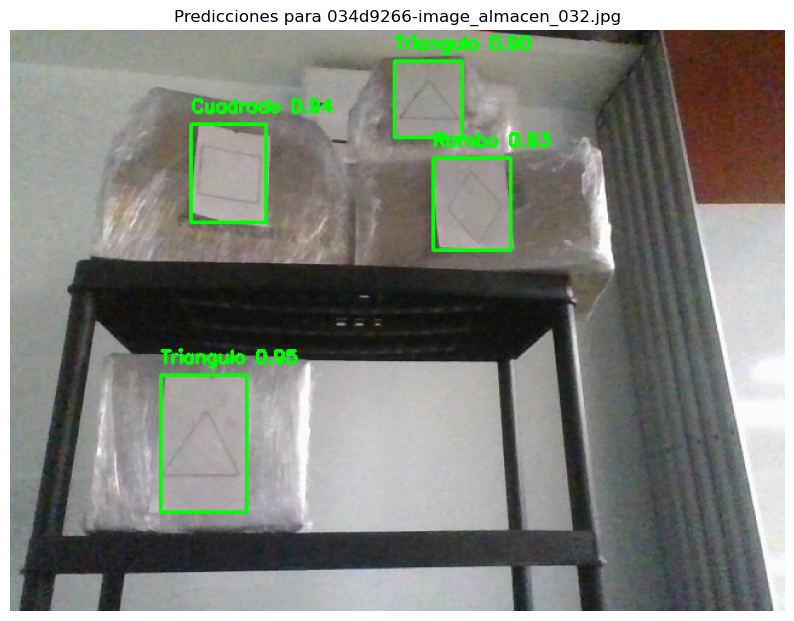


image 1/1 c:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\images\test\0e2dd8aa-image_almacen_025.jpg: 576x736 1 Cuadrado, 1 Rombo, 2 Triangulos, 134.9ms
Speed: 7.5ms preprocess, 134.9ms inference, 1.0ms postprocess per image at shape (1, 3, 576, 736)


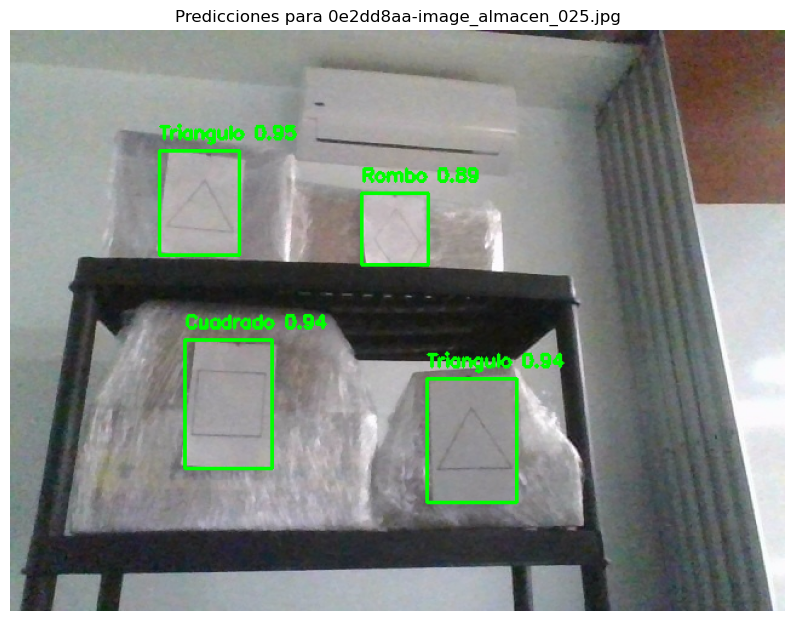


image 1/1 c:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\images\test\102458fb-image_almacen_111.jpg: 576x736 1 Cuadrado, 1 Rombo, 2 Triangulos, 228.6ms
Speed: 5.0ms preprocess, 228.6ms inference, 2.4ms postprocess per image at shape (1, 3, 576, 736)


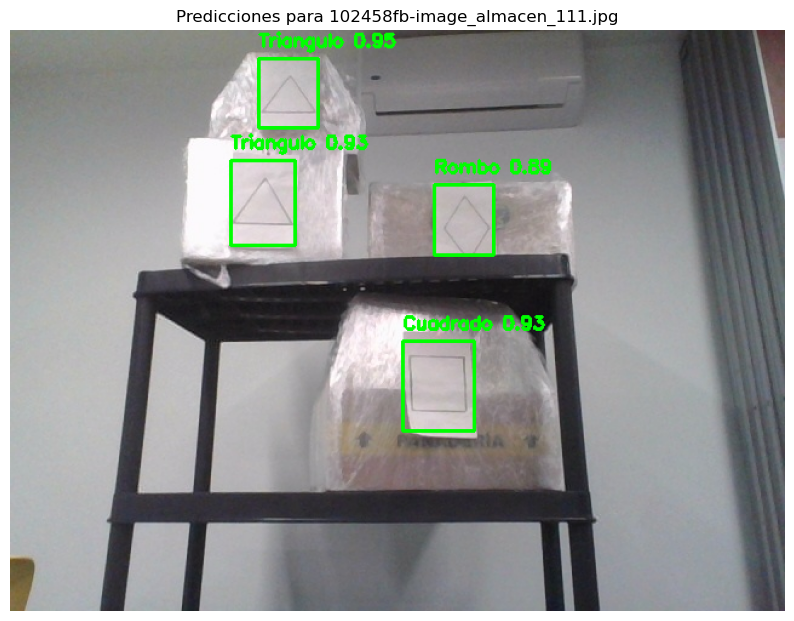


image 1/1 c:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\images\test\1a2a0830-image_almacen_023.jpg: 576x736 1 Cuadrado, 1 Rombo, 1 Triangulo, 138.1ms
Speed: 6.0ms preprocess, 138.1ms inference, 1.0ms postprocess per image at shape (1, 3, 576, 736)


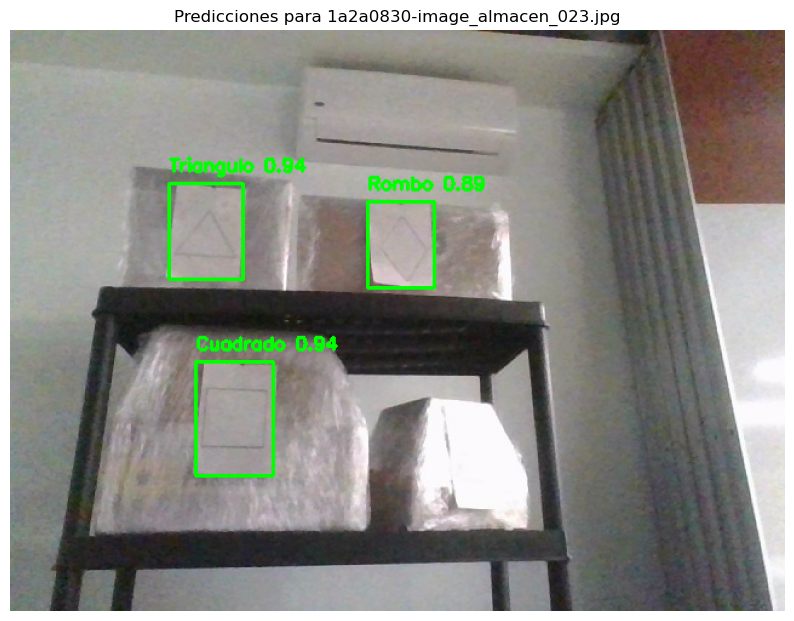


image 1/1 c:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\images\test\59a4eef0-image_almacen_053.jpg: 576x736 1 Cuadrado, 1 Rombo, 2 Triangulos, 244.2ms
Speed: 5.0ms preprocess, 244.2ms inference, 2.0ms postprocess per image at shape (1, 3, 576, 736)


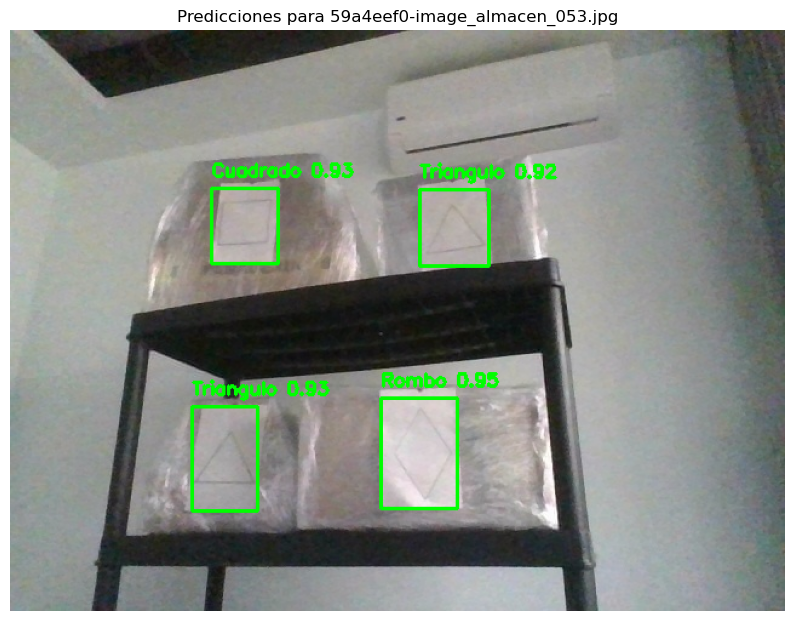


image 1/1 c:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\images\test\86ec079c-image_almacen_124.jpg: 576x736 1 Cuadrado, 1 Rombo, 2 Triangulos, 215.5ms
Speed: 8.0ms preprocess, 215.5ms inference, 2.5ms postprocess per image at shape (1, 3, 576, 736)


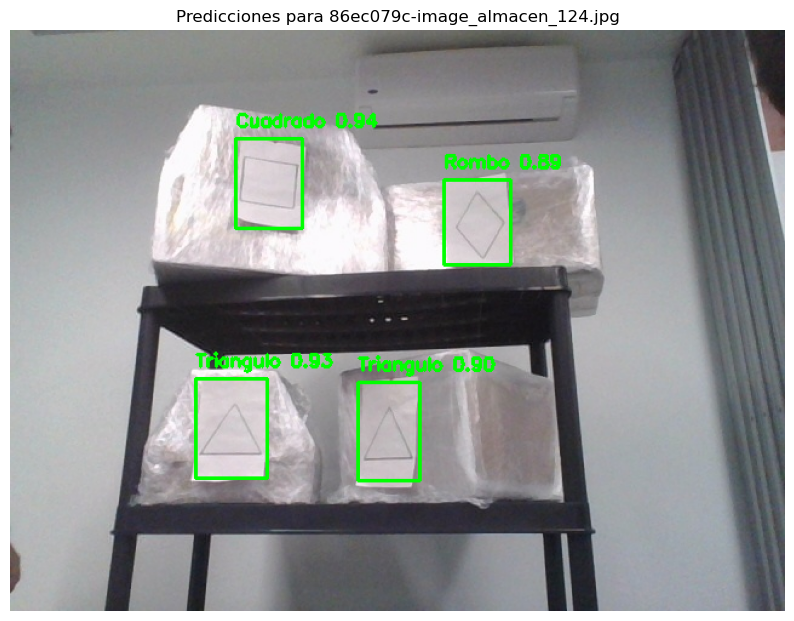


image 1/1 c:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\images\test\b45cf9a1-image_almacen_106.jpg: 576x736 1 Cuadrado, 1 Rombo, 2 Triangulos, 206.8ms
Speed: 5.3ms preprocess, 206.8ms inference, 1.2ms postprocess per image at shape (1, 3, 576, 736)


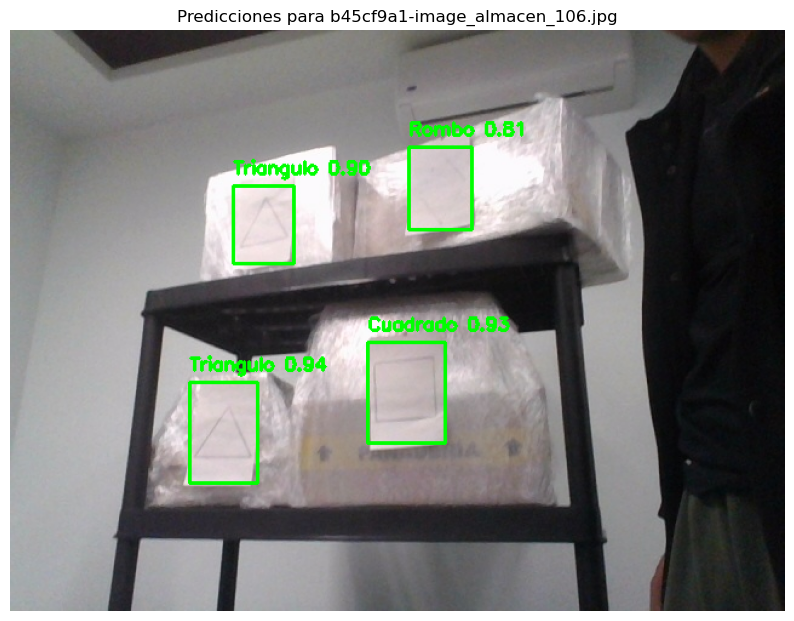


image 1/1 c:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\images\test\b58b49ab-image_almacen_014.jpg: 576x736 1 Cuadrado, 1 Rombo, 2 Triangulos, 171.3ms
Speed: 5.2ms preprocess, 171.3ms inference, 1.0ms postprocess per image at shape (1, 3, 576, 736)


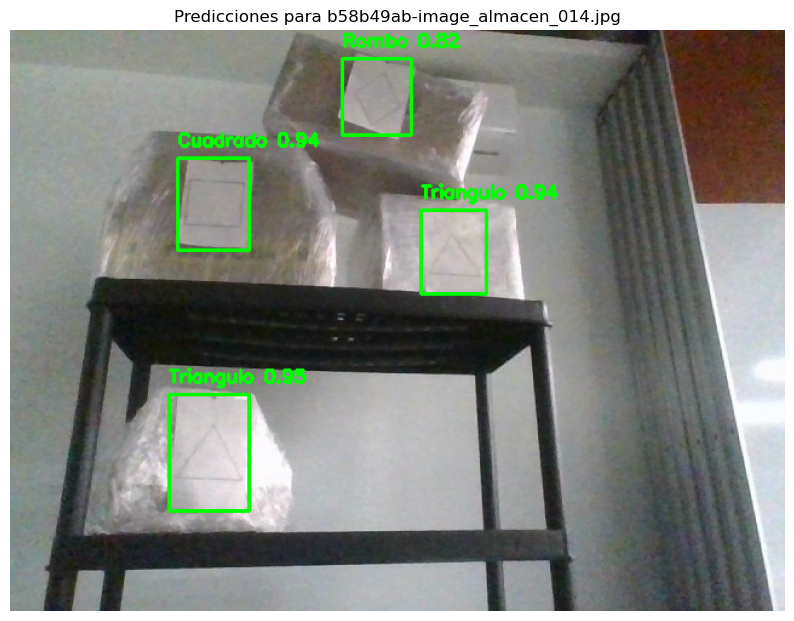


image 1/1 c:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\images\test\b64ef8be-image_almacen_019.jpg: 576x736 1 Cuadrado, 1 Rombo, 2 Triangulos, 208.8ms
Speed: 6.5ms preprocess, 208.8ms inference, 2.0ms postprocess per image at shape (1, 3, 576, 736)


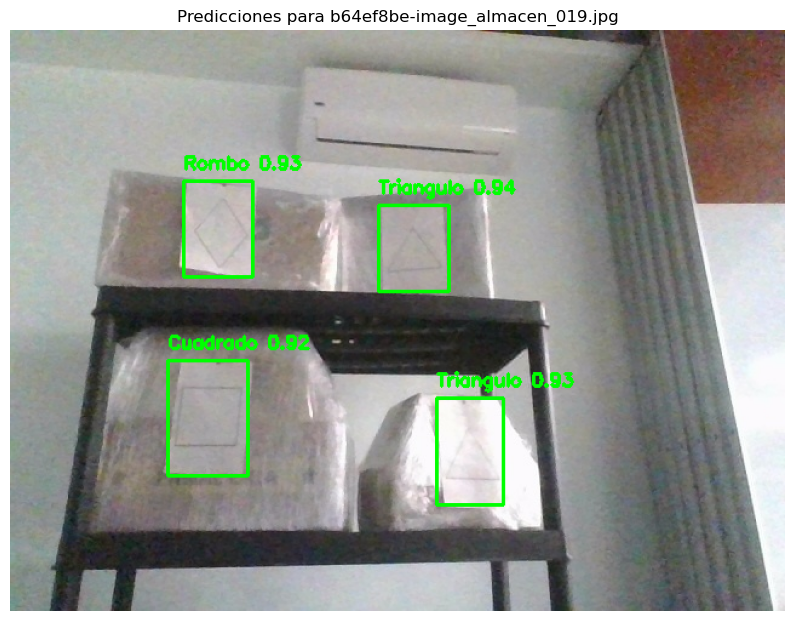


image 1/1 c:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\images\test\c0142c47-image_almacen_085.jpg: 576x736 1 Cuadrado, 1 Pallet_Sin_Info, 1 Rombo, 1 Triangulo, 190.6ms
Speed: 5.6ms preprocess, 190.6ms inference, 2.0ms postprocess per image at shape (1, 3, 576, 736)


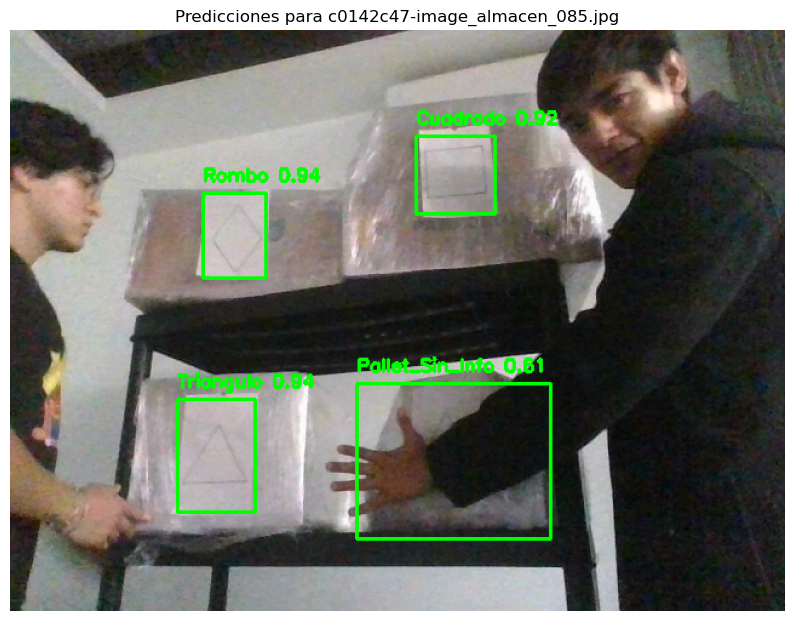


image 1/1 c:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\images\test\c47a4d99-image_almacen_024.jpg: 576x736 1 Cuadrado, 1 Rombo, 2 Triangulos, 256.4ms
Speed: 7.2ms preprocess, 256.4ms inference, 2.0ms postprocess per image at shape (1, 3, 576, 736)


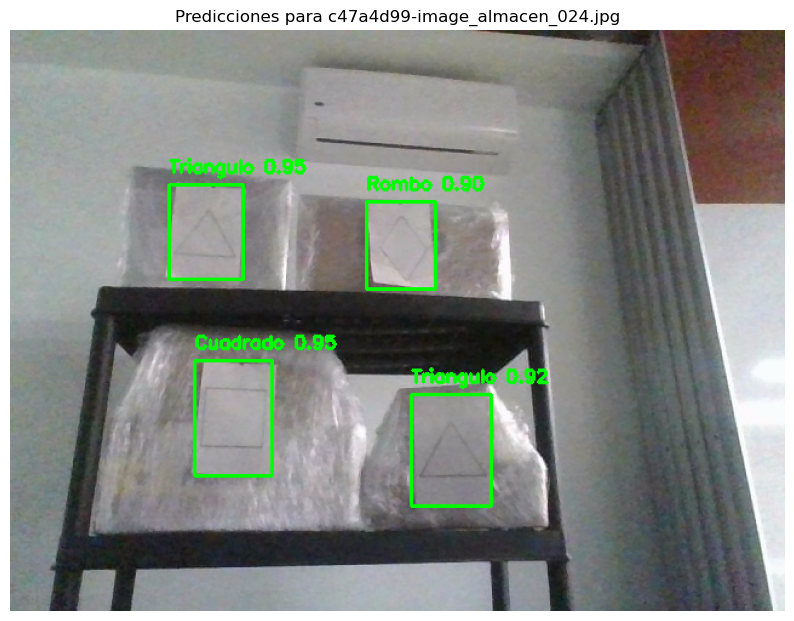


image 1/1 c:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\images\test\e6f41197-image_almacen_150.jpg: 576x736 1 Cuadrado, 1 Rombo, 1 Triangulo, 196.9ms
Speed: 5.0ms preprocess, 196.9ms inference, 1.0ms postprocess per image at shape (1, 3, 576, 736)


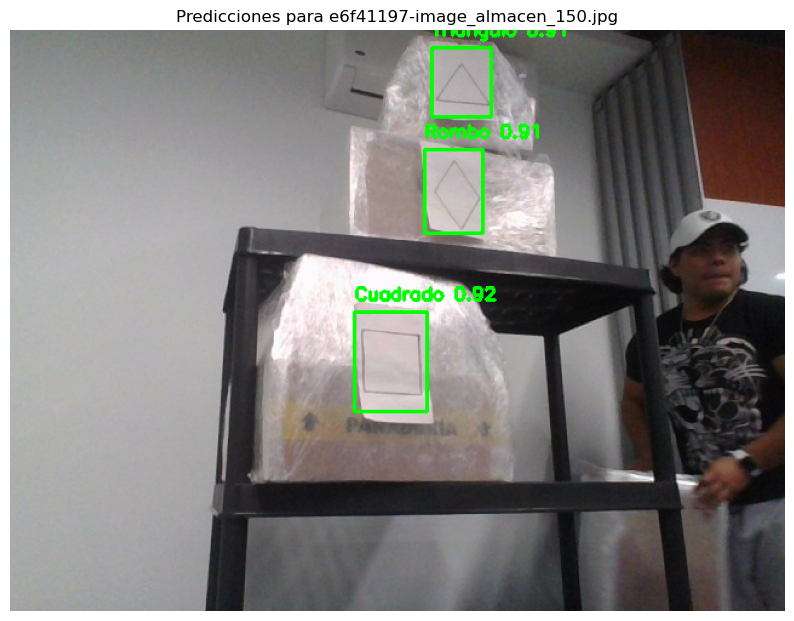


image 1/1 c:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\images\test\ef19179a-image_almacen_081.jpg: 576x736 1 Cuadrado, 1 Rombo, 1 Triangulo, 239.9ms
Speed: 9.4ms preprocess, 239.9ms inference, 1.0ms postprocess per image at shape (1, 3, 576, 736)


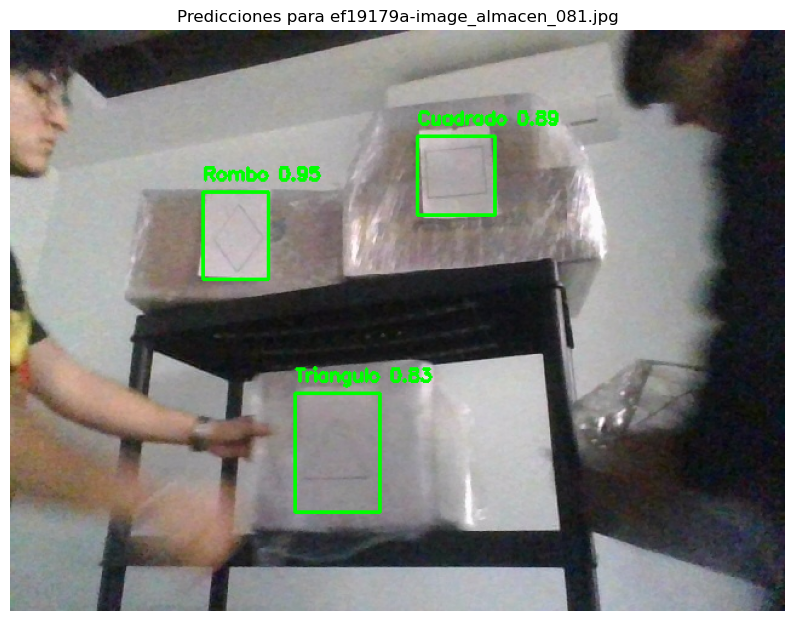


image 1/1 c:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\images\test\fbf562e5-image_almacen_013.jpg: 576x736 1 Cuadrado, 1 Rombo, 2 Triangulos, 191.5ms
Speed: 7.3ms preprocess, 191.5ms inference, 2.0ms postprocess per image at shape (1, 3, 576, 736)


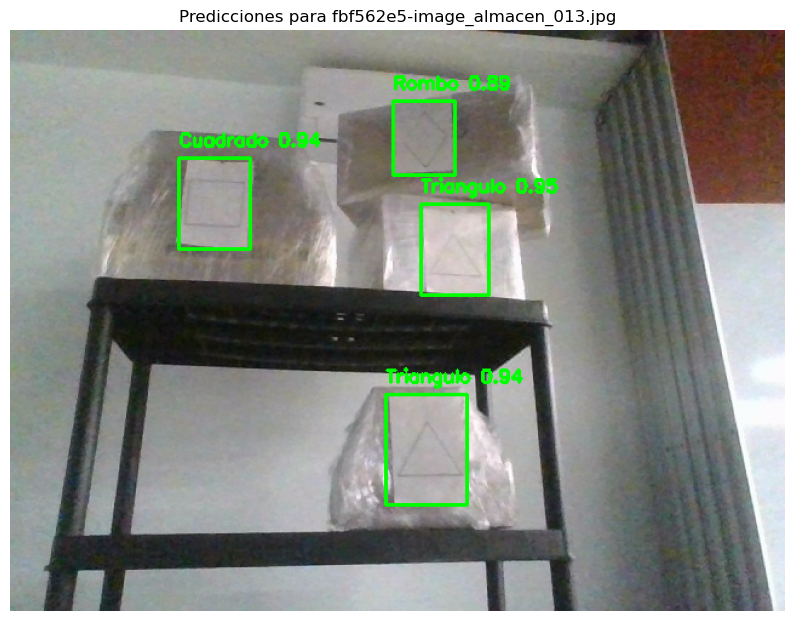


image 1/1 c:\Users\julia\Documents\Tec de Monterrey\7mo Semestre\modelo_pallets\YOLO\images\test\fe2b0d67-image_almacen_103.jpg: 576x736 1 Cuadrado, 2 Pallet_Sin_Infos, 1 Triangulo, 190.5ms
Speed: 5.0ms preprocess, 190.5ms inference, 1.0ms postprocess per image at shape (1, 3, 576, 736)


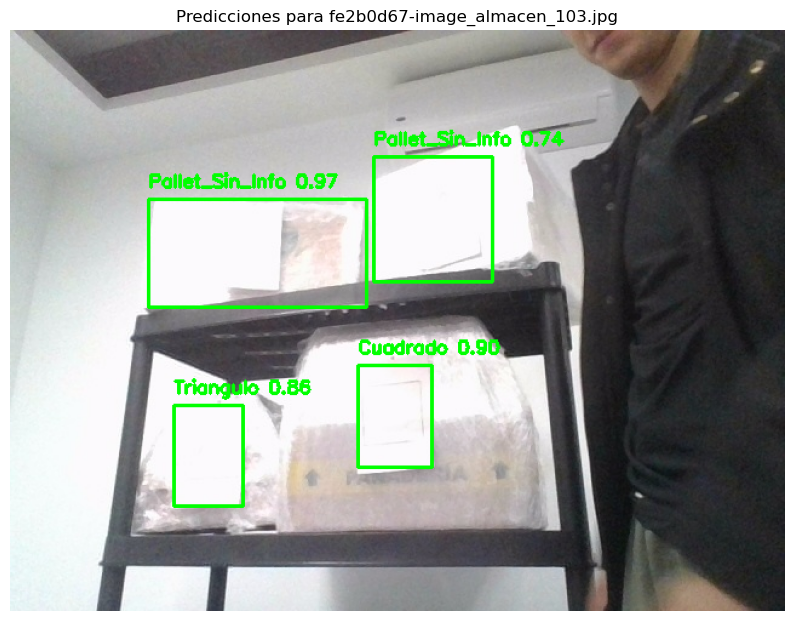

In [1]:
import os
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Cargar el modelo YOLOv8 Nano entrenado
model = YOLO('runs/detect/model_100epochs_batch32_imgsz_720/weights/best.pt')

# Directorio que contiene las imágenes de prueba
test_images_dir = 'YOLO\\images\\test'

# Iterar sobre todas las imágenes en el directorio de prueba
for image_file in os.listdir(test_images_dir):
    image_path = os.path.join(test_images_dir, image_file)
    
    # Realizar la predicción en la imagen
    results = model.predict(source=image_path, conf=0.6)
    
    # Obtener las predicciones y las cajas delimitadoras
    predictions = results[0]  # El primer resultado
    boxes = predictions.boxes  # Cajas delimitadoras
    class_ids = boxes.cls.int()  # IDs de las clases como enteros
    confidences = boxes.conf  # Confianza de cada predicción

    # Obtener los nombres de las clases del modelo
    class_names = model.names  # Diccionario de nombres de clases

    # Cargar la imagen original con OpenCV
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error al cargar la imagen: {image_path}")
        continue

    # Convertir de BGR a RGB para mostrar con matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Dibujar los recuadros y las etiquetas en la imagen
    for box, class_id, confidence in zip(boxes.xyxy, class_ids, confidences):
        x1, y1, x2, y2 = map(int, box)  # Coordenadas de la caja

        # Obtener el nombre de la clase usando el class_id
        label = class_names.get(class_id.item(), "Unknown")  # Utilizar un valor predeterminado si no se encuentra

        # Dibujar el rectángulo alrededor del objeto detectado
        cv2.rectangle(image_rgb, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Verde para el rectángulo

        # Escribir la etiqueta y la confianza en la imagen
        text = f"{label} {confidence:.2f}"
        cv2.putText(image_rgb, text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Mostrar la imagen con las predicciones usando matplotlib
    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)
    plt.axis('off')  # Quitar los ejes
    plt.title(f"Predicciones para {image_file}")
    plt.show()


In [ ]:
model.export(format='onnx')